## A Study on the LIME Efficiency
30/06/2020 by XZ

In [1]:
import os
import keras
from keras.applications import inception_v3 as inc_net
from keras.preprocessing import image
from keras.applications.imagenet_utils import decode_predictions
from skimage.io import imread
import matplotlib.pyplot as plt
#%matplotlib inline
import numpy as np
from skimage.segmentation import mark_boundaries

import sys
sys.path.append("..")# allow the notebook to find the parent folder
#from lime.lime_image import *
from lime import lime_image

print('Notebook run using keras:', keras.__version__)
print(sys.path)

Using TensorFlow backend.


Notebook run using keras: 2.3.1
['C:\\Users\\ZhaoXingyu\\Desktop\\Bayesian_LIME\\BayLime_project\\experiments', 'C:\\z3-4.6.0-x64-win\\bin\\python', 'C:\\ProgramData\\Anaconda3\\python37.zip', 'C:\\ProgramData\\Anaconda3\\DLLs', 'C:\\ProgramData\\Anaconda3\\lib', 'C:\\ProgramData\\Anaconda3', '', 'C:\\ProgramData\\Anaconda3\\lib\\site-packages', 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\win32', 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\win32\\lib', 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\Pythonwin', 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\IPython\\extensions', 'C:\\Users\\ZhaoXingyu\\.ipython', '..']


In [2]:
#Here we create a standard InceptionV3 pretrained model 
#and use it on images by first preprocessing them with the preprocessing tools
inet_model = inc_net.InceptionV3()

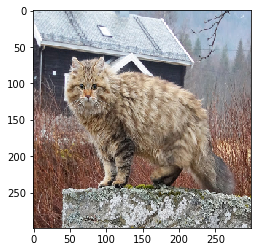

('n02123394', 'Persian_cat', 0.6940703)
('n02123045', 'tabby', 0.024397371)
('n02123159', 'tiger_cat', 0.0158316)
('n02127052', 'lynx', 0.011045758)
('n02117135', 'hyena', 0.007892745)


In [3]:
def transform_img_fn(path_list):
    out = []
    for img_path in path_list:
        img = image.load_img(img_path, target_size=(299, 299))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = inc_net.preprocess_input(x)
        out.append(x)
    return np.vstack(out)


images = transform_img_fn([os.path.join('..\data','forest_cat.jpg')])
# I'm dividing by 2 and adding 0.5 because of
# how this Inception represents images
plt.imshow(images[0] / 2 + 0.5)
plt.show()
preds = inet_model.predict(images)
for x in decode_predictions(preds)[0]:
    print(x)

the number of features: 31


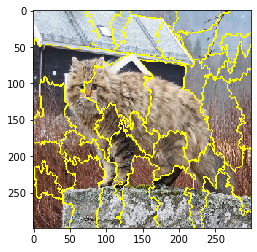


using non_Bay option for model regressor
For feature of segment 13
The mean of the (posterior) coefficient 0.4027444180357531
The variance of the (posterior) coefficient 0.0
For feature of segment 10
The mean of the (posterior) coefficient 0.4014383118389556
The variance of the (posterior) coefficient 0.0
For feature of segment 2
The mean of the (posterior) coefficient -0.08706511944799404
The variance of the (posterior) coefficient 0.0
For feature of segment 16
The mean of the (posterior) coefficient -0.0753454161448374
The variance of the (posterior) coefficient 0.0
For feature of segment 6
The mean of the (posterior) coefficient 0.07215391437920135
The variance of the (posterior) coefficient 0.0
For feature of segment 3
The mean of the (posterior) coefficient 0.06776318642166025
The variance of the (posterior) coefficient 0.0
For feature of segment 24
The mean of the (posterior) coefficient -0.06485117955862196
The variance of the (posterior) coefficient 0.0
For feature of segment 

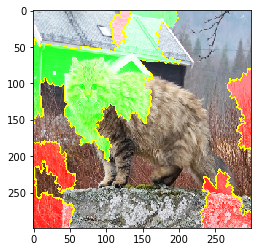

In [4]:
explainer = lime_image.LimeImageExplainer(feature_selection='none')#kernel_width=0.1   feature_selection='none'

# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
explanation = explainer.explain_instance(images[0], inet_model.predict,
                                         top_labels=1, hide_color=0, batch_size=10,
                                         num_samples=100,model_regressor='non_Bay')#'non_Bay' 'Bay_non_info_prior' 'Bay_info_prior'

# temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=2, hide_rest=True)
# plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
# plt.show()

# temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
# plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
# plt.show()

temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=8, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
plt.show()


In [5]:
import timeit
import time

## this part is used to capture return value with Python timeit module
##cf. https://stackoverflow.com/questions/24812253/how-can-i-capture-return-value-with-python-timeit-module
## A warmup example...

def f(x,y):
    a=x*y+10
    return a 

x = 5
y = 7

print(timeit.timeit(stmt='f(x,y)',
                    setup='from __main__ import f, x, y',
                    number=100))

2.390000000218606e-05


In [6]:
def the_LIME_interpretor(n_samples):
    explainer = lime_image.LimeImageExplainer(feature_selection='none')#kernel_width=0.1   feature_selection='none'
    explanation = explainer.explain_instance(images[0], inet_model.predict,
                                         top_labels=1, hide_color=0, batch_size=10,
                                         num_samples=n_samples,model_regressor='non_Bay')#'non_Bay' 'Bay_non_info_prior' 'Bay_info_prior'

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=8, hide_rest=False)
    plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
    plt.show()
    return 

the number of features: 80


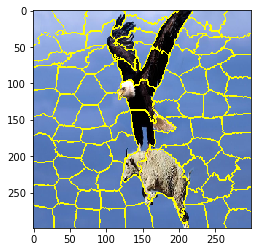


using non_Bay option for model regressor
For feature of segment 11
The mean of the (posterior) coefficient 0.03949689592421445
The variance of the (posterior) coefficient 0.0
For feature of segment 12
The mean of the (posterior) coefficient 0.03949689592421445
The variance of the (posterior) coefficient 0.0
For feature of segment 15
The mean of the (posterior) coefficient 0.03949689592421445
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.03949689592421445
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.03949689592421445
The variance of the (posterior) coefficient 0.0
For feature of segment 59
The mean of the (posterior) coefficient 0.03949689592421445
The variance of the (posterior) coefficient 0.0
For feature of segment 39
The mean of the (posterior) coefficient 0.02985954219356767
The variance of the (posterior) coefficient 0.0
For feature of segme

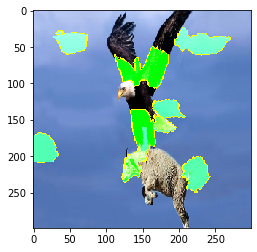

the number of features: 80


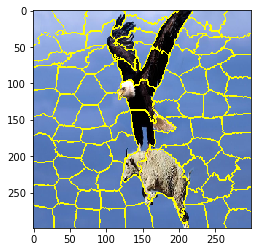


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.3707138040018479
The variance of the (posterior) coefficient 0.0
For feature of segment 74
The mean of the (posterior) coefficient 0.12778530754044812
The variance of the (posterior) coefficient 0.0
For feature of segment 3
The mean of the (posterior) coefficient -0.11615191311867173
The variance of the (posterior) coefficient 0.0
For feature of segment 18
The mean of the (posterior) coefficient -0.10206829738012242
The variance of the (posterior) coefficient 0.0
For feature of segment 8
The mean of the (posterior) coefficient -0.10132008316137482
The variance of the (posterior) coefficient 0.0
For feature of segment 43
The mean of the (posterior) coefficient -0.08775434592797102
The variance of the (posterior) coefficient 0.0
For feature of segment 50
The mean of the (posterior) coefficient -0.07947730722284758
The variance of the (posterior) coefficient 0.0
For feature of seg

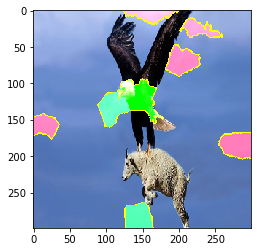

the number of features: 80


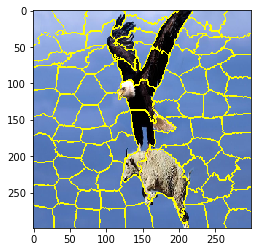


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.48840941606766836
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.11521418522278386
The variance of the (posterior) coefficient 0.0
For feature of segment 60
The mean of the (posterior) coefficient -0.10216323466079459
The variance of the (posterior) coefficient 0.0
For feature of segment 21
The mean of the (posterior) coefficient -0.09530137456748532
The variance of the (posterior) coefficient 0.0
For feature of segment 64
The mean of the (posterior) coefficient 0.08894773588227364
The variance of the (posterior) coefficient 0.0
For feature of segment 22
The mean of the (posterior) coefficient -0.08097061304534216
The variance of the (posterior) coefficient 0.0
For feature of segment 28
The mean of the (posterior) coefficient 0.07833880999115193
The variance of the (posterior) coefficient 0.0
For feature of s

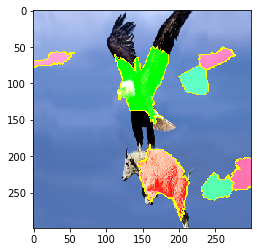

the number of features: 80


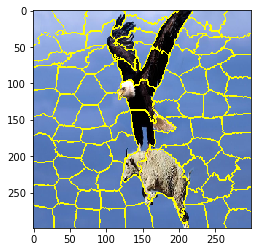


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5661455322602637
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.15974557491417288
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.11488828426436994
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09996547114820133
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.07954893666871002
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.07886595574867966
The variance of the (posterior) coefficient 0.0
For feature of segment 25
The mean of the (posterior) coefficient 0.07630761022123714
The variance of the (posterior) coefficient 0.0
For feature of segment

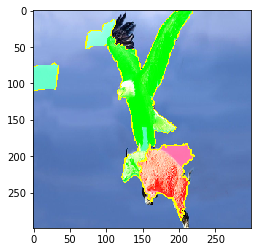

the number of features: 80


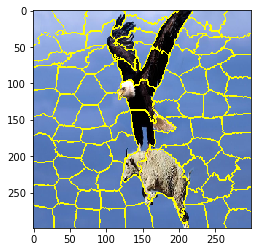


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6196598964705268
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16540208850037244
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.0825241693644537
The variance of the (posterior) coefficient 0.0
For feature of segment 62
The mean of the (posterior) coefficient 0.0732440997422154
The variance of the (posterior) coefficient 0.0
For feature of segment 13
The mean of the (posterior) coefficient -0.06595399146869929
The variance of the (posterior) coefficient 0.0
For feature of segment 66
The mean of the (posterior) coefficient -0.06252986312050995
The variance of the (posterior) coefficient 0.0
For feature of segment 78
The mean of the (posterior) coefficient -0.06198446151499239
The variance of the (posterior) coefficient 0.0
For feature of segm

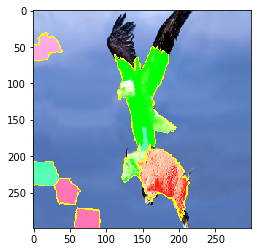

the number of features: 80


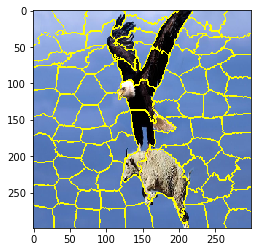


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5658063220235204
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.19133570940448985
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.11130968105225074
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.10399570607650598
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08082369859577078
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.06678058135054053
The variance of the (posterior) coefficient 0.0
For feature of segment 49
The mean of the (posterior) coefficient 0.0632826578779065
The variance of the (posterior) coefficient 0.0
For feature of segmen

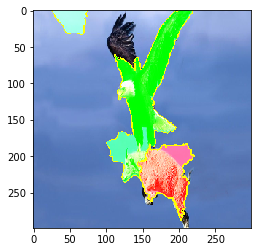

the number of features: 80


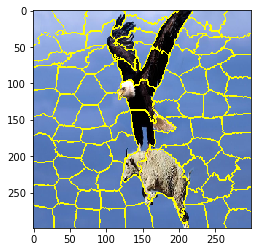


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.610908546536431
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16172690166826045
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.10132223774238779
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.09179876516556823
The variance of the (posterior) coefficient 0.0
For feature of segment 50
The mean of the (posterior) coefficient -0.06680071799370103
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.05891402798010655
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.049591228075998785
The variance of the (posterior) coefficient 0.0
For feature of segme

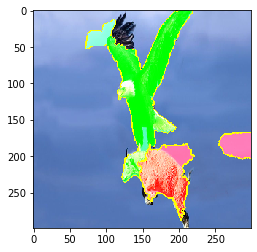

the number of features: 80


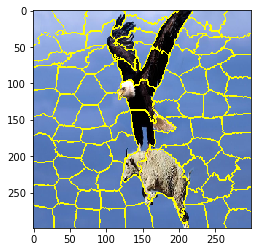


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6147706026075431
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17287023118774675
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.10137903384566742
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08099557250648805
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.07958792168767173
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.0668536542274493
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.043080834927619244
The variance of the (posterior) coefficient 0.0
For feature of segmen

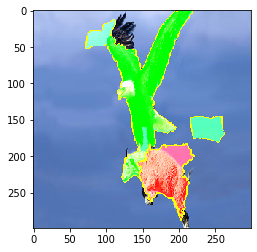

the number of features: 80


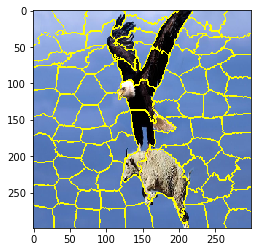


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5822546131657508
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.19219930752727185
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.11232437530033855
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.10686367556521001
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.1020657218431741
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.05576434778189536
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.046336057756478796
The variance of the (posterior) coefficient 0.0
For feature of segmen

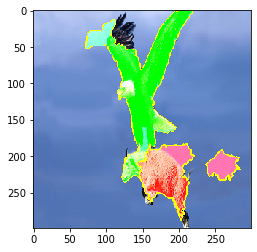

the number of features: 80


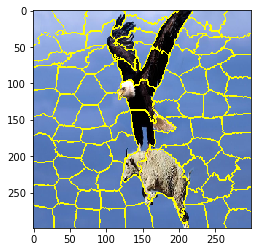


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6062380944462274
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1604875183460167
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08196157850721877
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.07808938418924785
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06907020461285725
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.06296191173869568
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.040002561368124176
The variance of the (posterior) coefficient 0.0
For feature of segment

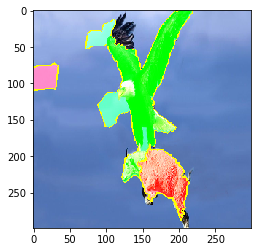

the number of features: 80


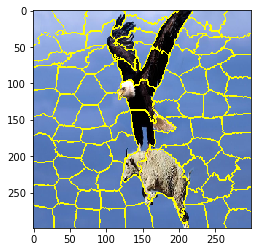


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6097553285756836
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17456728509375824
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.10683287702771352
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.10367771018482042
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.0770627874481989
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.04262440380103633
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.041380288729384526
The variance of the (posterior) coefficient 0.0
For feature of segmen

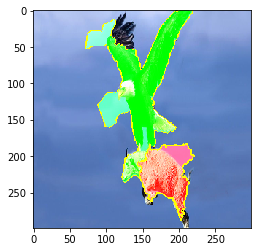

the number of features: 80


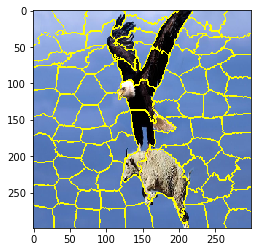


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6114214514839539
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.15984044008384957
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.09645859021015764
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09083701996320137
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.07983256755845397
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06423826596525249
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.05041014498497336
The variance of the (posterior) coefficient 0.0
For feature of segmen

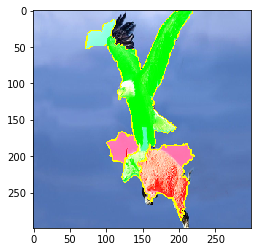

the number of features: 80


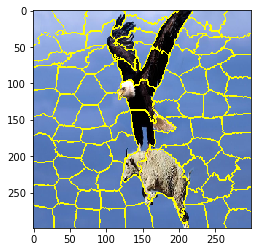


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6042677719262333
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.18082377208839256
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09867845548911129
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08162278346422865
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.0755603138155709
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.049058561773600864
The variance of the (posterior) coefficient 0.0
For feature of segment 65
The mean of the (posterior) coefficient -0.04764991663864543
The variance of the (posterior) coefficient 0.0
For feature of segmen

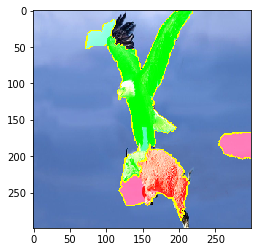

the number of features: 80


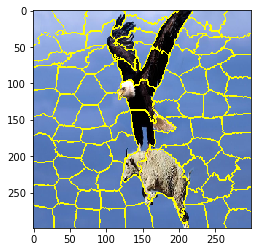


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5946538238822427
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.18085659196731596
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08844145239131455
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.06984234602516985
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.06472561828774359
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.0633059943977179
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.037224094897464075
The variance of the (posterior) coefficient 0.0
For feature of segment

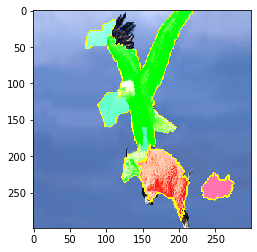

the number of features: 80


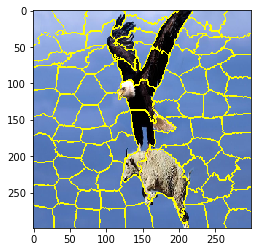


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6101326729199946
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17675180326866727
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09250848690956978
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08180316567967143
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.06305457865587592
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.05396355397716433
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.04655442321749738
The variance of the (posterior) coefficient 0.0
For feature of segmen

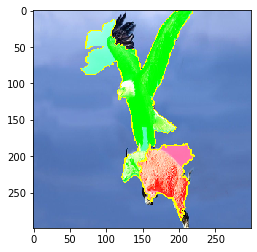

the number of features: 80


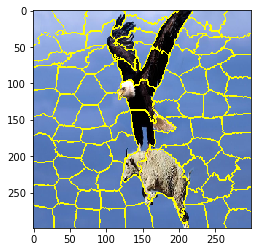


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6216397590948735
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16367169558952116
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09656978103448874
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08408117987199469
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.07247372547643764
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.05944608598342186
The variance of the (posterior) coefficient 0.0
For feature of segment 13
The mean of the (posterior) coefficient -0.02677936874435086
The variance of the (posterior) coefficient 0.0
For feature of segmen

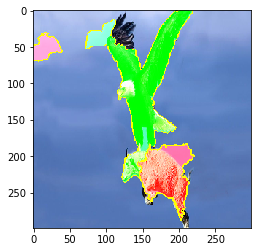

the number of features: 80


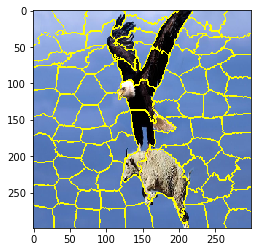


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.608488935330975
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1734259013681447
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.10166336743547062
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.1008644086860608
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07470750158365928
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.04934643997300196
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.0375052029654199
The variance of the (posterior) coefficient 0.0
For feature of segment 77

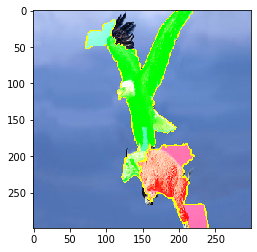

the number of features: 80


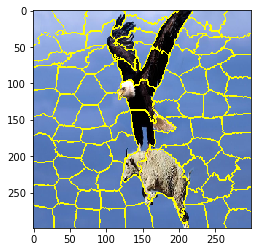


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6116083556098352
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16568607934450696
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08259864051732639
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.07890790278123862
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07159045040196992
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06373222913711288
The variance of the (posterior) coefficient 0.0
For feature of segment 46
The mean of the (posterior) coefficient 0.030816125986796547
The variance of the (posterior) coefficient 0.0
For feature of segmen

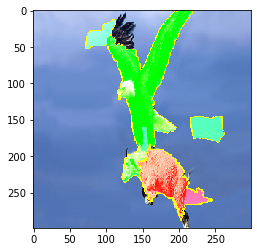

the number of features: 80


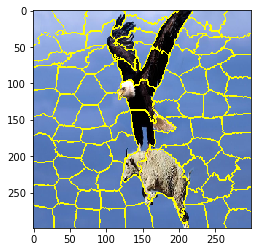


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6056067377219188
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.15147917350321713
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08901717791593053
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08851390210422996
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08036611600387483
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.053780841634896326
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.0397674118095088
The variance of the (posterior) coefficient 0.0
For feature of segmen

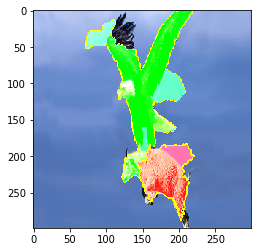

the number of features: 80


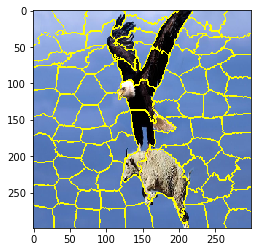


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6052848837301074
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17203804428021421
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.10229952596005555
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09990603897167388
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09474455101492436
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06035937844678999
The variance of the (posterior) coefficient 0.0
For feature of segment 29
The mean of the (posterior) coefficient 0.035706875661696405
The variance of the (posterior) coefficient 0.0
For feature of segmen

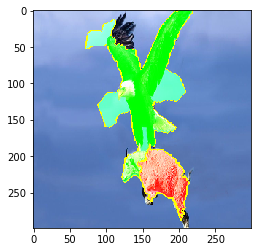

the number of features: 80


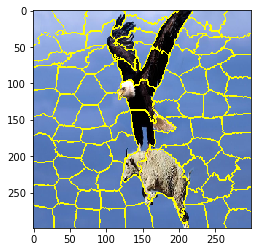


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6339176535938648
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1672266699676576
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.0882098780852037
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08097090315799281
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07180320817698374
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.0582724750048457
The variance of the (posterior) coefficient 0.0
For feature of segment 29
The mean of the (posterior) coefficient 0.03519589274805527
The variance of the (posterior) coefficient 0.0
For feature of segment 56

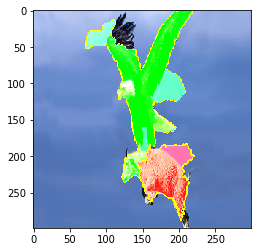

the number of features: 80


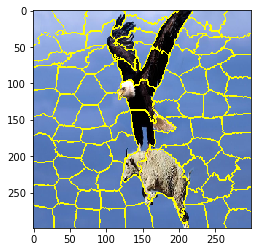


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6055771529399121
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17356494940509234
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08740130087624969
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08560634153862011
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08501918202669094
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.05420503695603789
The variance of the (posterior) coefficient 0.0
For feature of segment 72
The mean of the (posterior) coefficient -0.0316141629108726
The variance of the (posterior) coefficient 0.0
For feature of segment

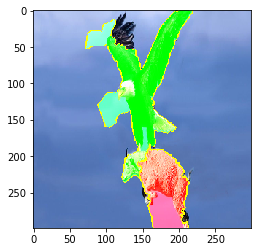

the number of features: 80


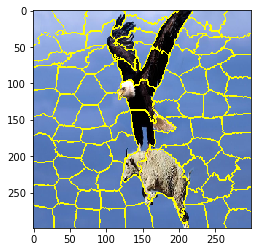


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6304184019464318
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16529991305606434
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.10079611820390963
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09594855533759174
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08543916583924961
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.053554906589808084
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.03530370573324505
The variance of the (posterior) coefficient 0.0
For feature of segme

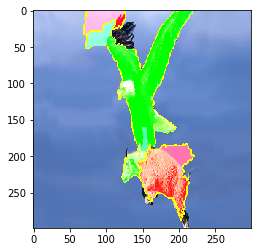

the number of features: 80


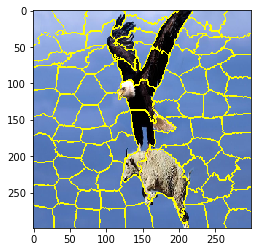


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6129491813929047
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16589990196914017
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.11810048893720662
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.10074523742967581
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.09557195529123301
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.057512006277694976
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.04396705643844511
The variance of the (posterior) coefficient 0.0
For feature of segme

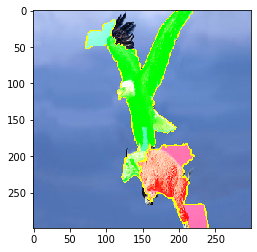

the number of features: 80


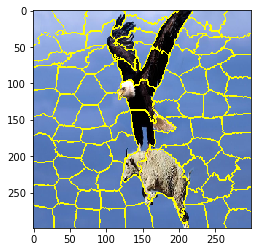


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.612485377099662
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16573246891506332
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.0946729753273058
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09128104651864591
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08425495421885064
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.07473176364468716
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.036700122810479456
The variance of the (posterior) coefficient 0.0
For feature of segment 

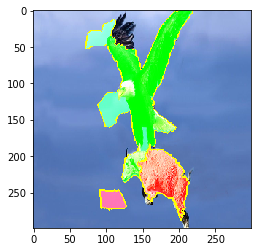

the number of features: 80


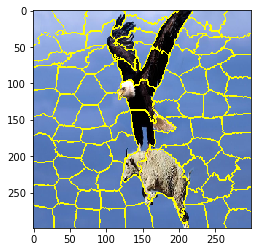


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6103831557545895
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1685600903991614
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.10087201486470812
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08831580275198662
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08486687315691754
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.0643930511613672
The variance of the (posterior) coefficient 0.0
For feature of segment 72
The mean of the (posterior) coefficient -0.03050626162709512
The variance of the (posterior) coefficient 0.0
For feature of segment 

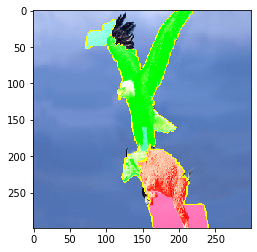

the number of features: 80


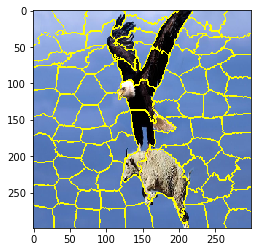


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5992415169096749
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17155619509804473
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.10032002889082384
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09954869540609369
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08563336125947937
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.0642923703182009
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.031158987630006154
The variance of the (posterior) coefficient 0.0
For feature of segmen

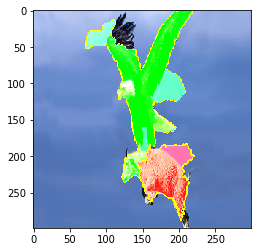

the number of features: 80


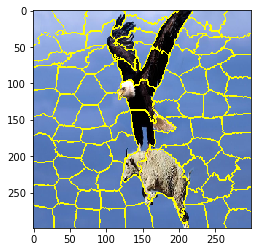


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6107272869704007
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.18373899474780342
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.10697101074632066
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09434606537183524
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.0774751312670455
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.05734877131514589
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.03527885119402077
The variance of the (posterior) coefficient 0.0
For feature of segment 

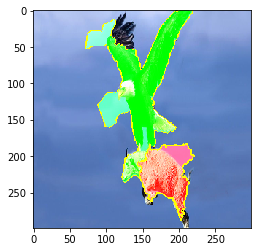

In [12]:
LIME_time=np.array([])
i=5
while i<=1500:
    
    n_samples=i


    temp=timeit.timeit(stmt='the_LIME_interpretor(n_samples)',
                    setup='from __main__ import the_LIME_interpretor, n_samples',
                    number=1)
    #print(temp[0], temp[1][0],temp[1][1])
    LIME_time=np.append(LIME_time,temp)
    i=i+55

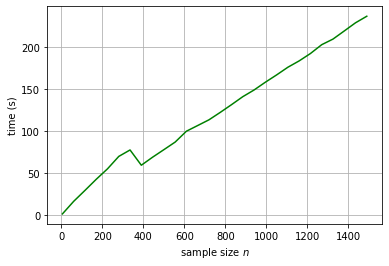

In [13]:
i=5
x_index=np.array([])
while i<=1500:
    x_index =np.append(x_index,i)
    i=i+55
## Above is to rescale the x axis; Note need to have the same setup with the loop above...

plt.plot(x_index,LIME_time,linestyle='-',color='green')

#plt.plot(x_index[w:],IPSP_est_upper[w:],linestyle='dotted',color='purple',label='IPSP upper bound')

#plt.axis([1, len(MCMC_time), 0, np.max(MCMC_time)])# set the ranges of axis
#plt.legend(fontsize=9,bbox_to_anchor=(1,1))
plt.xlabel('sample size $n$')
plt.ylabel('time (s)')
plt.grid(True)

plt.show()

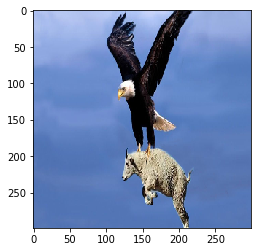

('n01614925', 'bald_eagle', 0.5944296)
('n01608432', 'kite', 0.021287818)
('n02106166', 'Border_collie', 0.0045800456)
('n03937543', 'pill_bottle', 0.0029079702)
('n02105412', 'kelpie', 0.002181248)
the number of features: 80


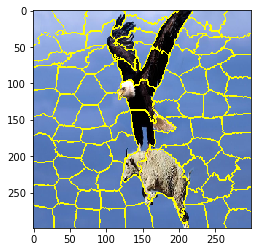


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.4815864062470511
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16080520747132843
The variance of the (posterior) coefficient 0.0
For feature of segment 52
The mean of the (posterior) coefficient -0.09425348477863843
The variance of the (posterior) coefficient 0.0
For feature of segment 63
The mean of the (posterior) coefficient 0.0926121347103646
The variance of the (posterior) coefficient 0.0
For feature of segment 11
The mean of the (posterior) coefficient 0.08105476519524765
The variance of the (posterior) coefficient 0.0
For feature of segment 47
The mean of the (posterior) coefficient -0.0782698102621639
The variance of the (posterior) coefficient 0.0
For feature of segment 73
The mean of the (posterior) coefficient -0.07759781541850833
The variance of the (posterior) coefficient 0.0
For feature of segm

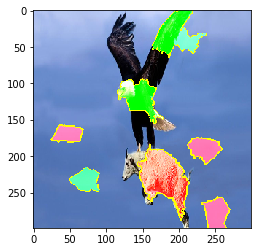

In [14]:
images = transform_img_fn([os.path.join('..\data','eagle_sheep.jpg')])
# I'm dividing by 2 and adding 0.5 because of
# how this Inception represents images
plt.imshow(images[0] / 2 + 0.5)
plt.show()
preds = inet_model.predict(images)
for x in decode_predictions(preds)[0]:
    print(x)
explainer = lime_image.LimeImageExplainer(feature_selection='none')#kernel_width=0.1   feature_selection='none'

# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
explanation = explainer.explain_instance(images[0], inet_model.predict,
                                         top_labels=1, hide_color=0, batch_size=10,
                                         num_samples=100,model_regressor='non_Bay')#'non_Bay' 'Bay_non_info_prior' 'Bay_info_prior'

# temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=2, hide_rest=True)
# plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
# plt.show()

# temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
# plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
# plt.show()

temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=8, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
plt.show()


the number of features: 80


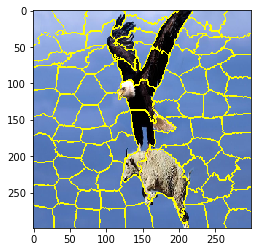


using non_Bay option for model regressor
For feature of segment 10
The mean of the (posterior) coefficient 0.028522361149968
The variance of the (posterior) coefficient 0.0
For feature of segment 17
The mean of the (posterior) coefficient 0.028522361149968
The variance of the (posterior) coefficient 0.0
For feature of segment 18
The mean of the (posterior) coefficient 0.028522361149968
The variance of the (posterior) coefficient 0.0
For feature of segment 32
The mean of the (posterior) coefficient 0.028522361149968
The variance of the (posterior) coefficient 0.0
For feature of segment 45
The mean of the (posterior) coefficient 0.028522361149968
The variance of the (posterior) coefficient 0.0
For feature of segment 62
The mean of the (posterior) coefficient 0.028522361149968
The variance of the (posterior) coefficient 0.0
For feature of segment 65
The mean of the (posterior) coefficient 0.028522361149968
The variance of the (posterior) coefficient 0.0
For feature of segment 3
The mean 

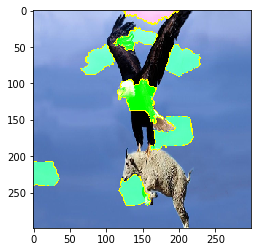

the number of features: 80


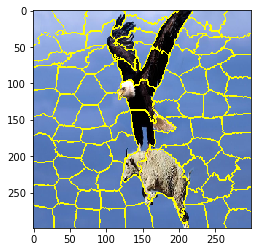


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.35932495438053036
The variance of the (posterior) coefficient 0.0
For feature of segment 50
The mean of the (posterior) coefficient 0.13139320508812288
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.12717131337694415
The variance of the (posterior) coefficient 0.0
For feature of segment 16
The mean of the (posterior) coefficient 0.11894385725390191
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.10653793713094563
The variance of the (posterior) coefficient 0.0
For feature of segment 72
The mean of the (posterior) coefficient -0.10316266305438299
The variance of the (posterior) coefficient 0.0
For feature of segment 51
The mean of the (posterior) coefficient -0.08586000349205768
The variance of the (posterior) coefficient 0.0
For feature of se

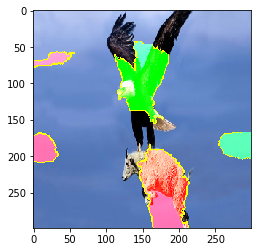

the number of features: 80


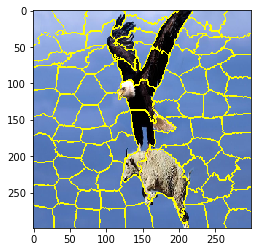


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5308422564692127
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.23579377581202285
The variance of the (posterior) coefficient 0.0
For feature of segment 14
The mean of the (posterior) coefficient 0.1043798565789156
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.09711765305692925
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.0712515540001296
The variance of the (posterior) coefficient 0.0
For feature of segment 60
The mean of the (posterior) coefficient -0.06773910324964559
The variance of the (posterior) coefficient 0.0
For feature of segment 22
The mean of the (posterior) coefficient -0.06694761771186146
The variance of the (posterior) coefficient 0.0
For feature of segme

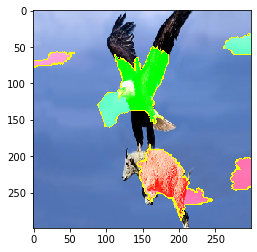

the number of features: 80


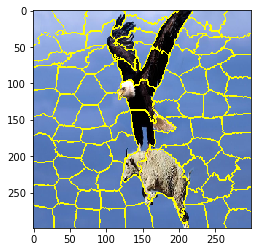


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5557396047752912
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16253924435003317
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.11496426376751914
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.10954204371624356
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08124604280766469
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.0800791000232752
The variance of the (posterior) coefficient 0.0
For feature of segment 80
The mean of the (posterior) coefficient -0.0753632325338398
The variance of the (posterior) coefficient 0.0
For feature of segment 

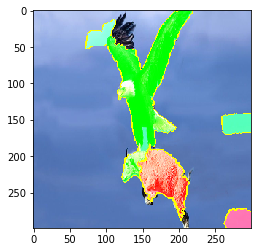

the number of features: 80


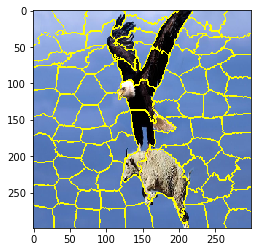


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5836859878513471
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.13607149034059668
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.11947271551678944
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.09580851729587446
The variance of the (posterior) coefficient 0.0
For feature of segment 49
The mean of the (posterior) coefficient -0.061953647265926205
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.0612736062244199
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.057376206024701226
The variance of the (posterior) coefficient 0.0
For feature of seg

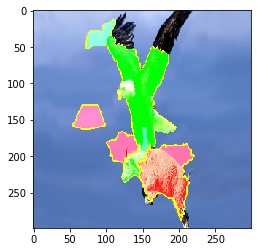

the number of features: 80


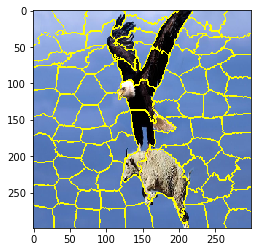


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5946375568206601
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17786899141681925
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.10567321595796227
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.09029566668476086
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08737226457828334
The variance of the (posterior) coefficient 0.0
For feature of segment 57
The mean of the (posterior) coefficient -0.06716813254978674
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.06307111180668866
The variance of the (posterior) coefficient 0.0
For feature of segm

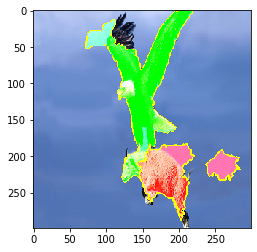

the number of features: 80


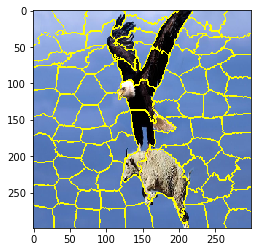


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5981687653211364
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1595598950685501
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.10407336811918702
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08826853385023622
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.07707975393462425
The variance of the (posterior) coefficient 0.0
For feature of segment 43
The mean of the (posterior) coefficient -0.04904127586123095
The variance of the (posterior) coefficient 0.0
For feature of segment 11
The mean of the (posterior) coefficient 0.04730370810599995
The variance of the (posterior) coefficient 0.0
For feature of segmen

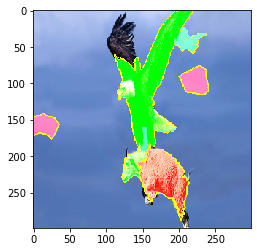

the number of features: 80


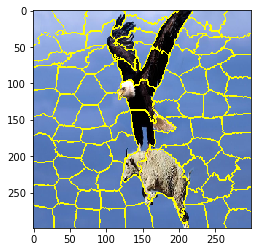


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5814804906427502
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.15874247595189084
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.11589388771116994
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09610894215203494
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09168971421972347
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.07014099829380648
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.04664152815976518
The variance of the (posterior) coefficient 0.0
For feature of segmen

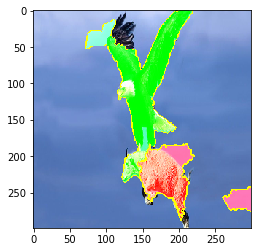

the number of features: 80


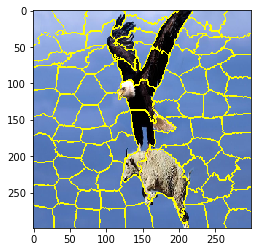


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6205252687783542
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16449273712018617
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.0894894447869985
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07433743638575316
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.06535266858563275
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.04522104265327061
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.043762125873214285
The variance of the (posterior) coefficient 0.0
For feature of segment

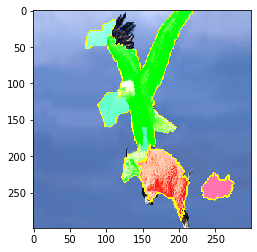

the number of features: 80


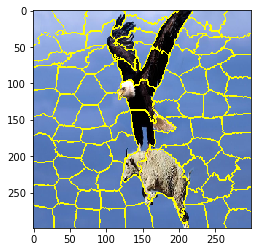


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6011167552023964
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16287729794503553
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09317128408758002
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.07879048270920709
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.06860453532237495
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.048013899818929624
The variance of the (posterior) coefficient 0.0
For feature of segment 76
The mean of the (posterior) coefficient -0.03689719478031699
The variance of the (posterior) coefficient 0.0
For feature of segme

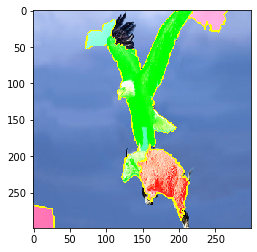

the number of features: 80


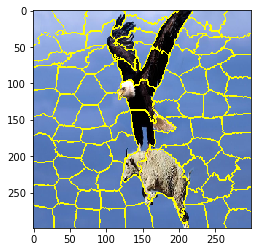


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6051218494317119
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1586401426479407
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.09582571303375205
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09073797299497469
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08502953669077629
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08073988115026855
The variance of the (posterior) coefficient 0.0
For feature of segment 61
The mean of the (posterior) coefficient -0.04751217455661797
The variance of the (posterior) coefficient 0.0
For feature of segment

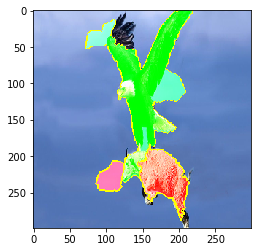

the number of features: 80


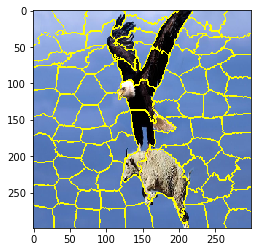


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6115248831935297
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.14535775863113534
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08800394490487404
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.08367198922626902
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.07835234119357294
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07081426262718125
The variance of the (posterior) coefficient 0.0
For feature of segment 29
The mean of the (posterior) coefficient 0.036037140612540895
The variance of the (posterior) coefficient 0.0
For feature of segmen

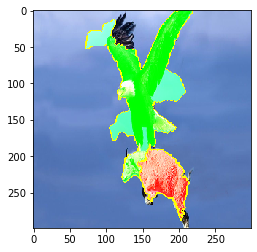

the number of features: 80


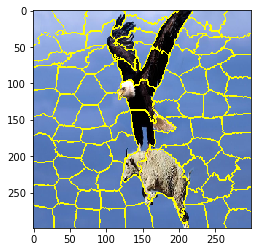


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6067198015251943
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16125763707830051
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.10443546490372453
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.0975207175416841
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09618437849311412
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06889389365111745
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.03907935604080003
The variance of the (posterior) coefficient 0.0
For feature of segment

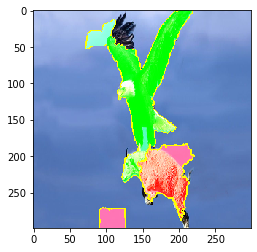

the number of features: 80


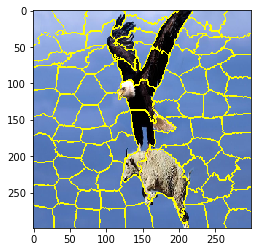


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5987781782002705
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17169086288098806
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09277149594915228
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08661431224761859
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06961222506736324
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.06580567644175132
The variance of the (posterior) coefficient 0.0
For feature of segment 23
The mean of the (posterior) coefficient 0.03410615921440622
The variance of the (posterior) coefficient 0.0
For feature of segment

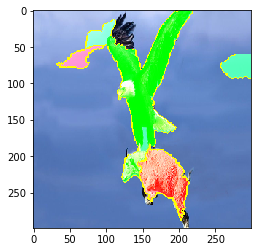

the number of features: 80


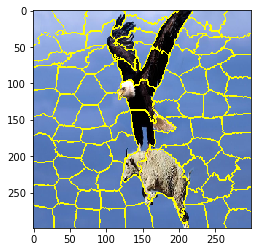


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6133265183613955
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1825538669861974
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08546236255206201
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08411222316505067
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.0761191925598034
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.051698664487653846
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.04958477865432183
The variance of the (posterior) coefficient 0.0
For feature of segment

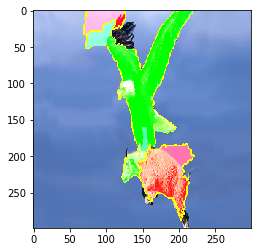

the number of features: 80


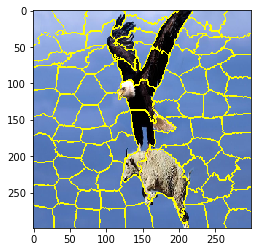


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6214022844028111
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.15471430413646906
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08542445685930918
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07858931230481157
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.07600728144978897
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.05177283370580035
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.044539955986930974
The variance of the (posterior) coefficient 0.0
For feature of segmen

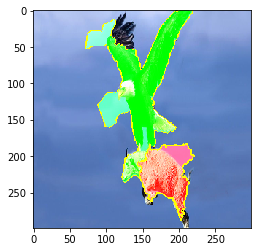

the number of features: 80


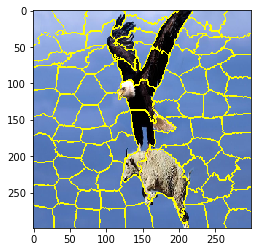


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6162798538154959
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16084540507156034
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09249334128248424
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08358182626068345
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.06913528001313353
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.050479283367712506
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.03823733370417418
The variance of the (posterior) coefficient 0.0
For feature of segmen

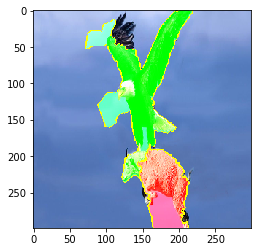

the number of features: 80


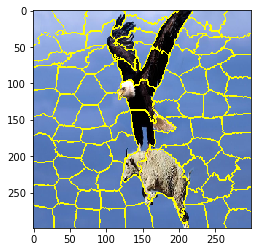


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.5750217479099093
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17883044673969486
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.118800471854702
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.10697921770518241
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07106339138351361
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06934967279106552
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.032870636362931555
The variance of the (posterior) coefficient 0.0
For feature of segment 

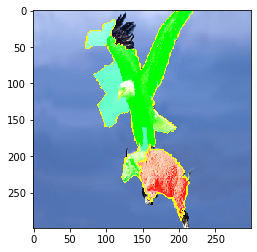

the number of features: 80


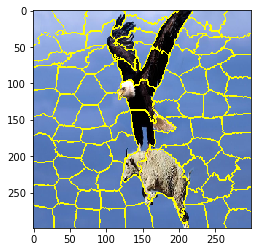


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6013825033955559
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17407930229428437
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08932007456017829
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08865690548368078
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08291086953499932
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.05379534623348804
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.04010078513103497
The variance of the (posterior) coefficient 0.0
For feature of segmen

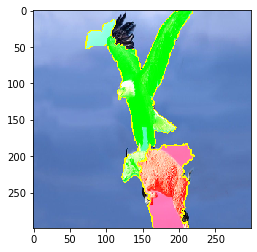

the number of features: 80


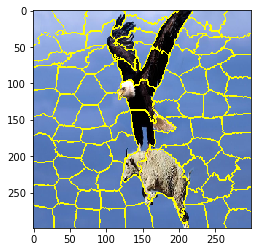


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.607626200732219
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1559288447690498
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09071842054083616
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08155614532749543
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07311957082818826
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.05380668331258344
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.03685568006106932
The variance of the (posterior) coefficient 0.0
For feature of segment 1

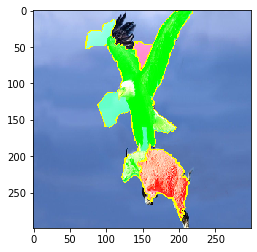

the number of features: 80


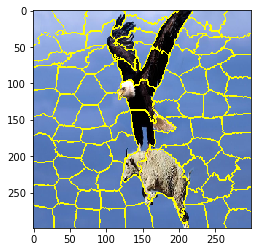


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6299278696758837
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1435662497207637
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08357352872371027
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08080446662224493
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.07943009483467549
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.046094211844229835
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.028340115720202046
The variance of the (posterior) coefficient 0.0
For feature of segme

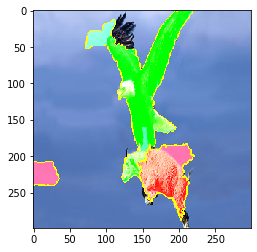

the number of features: 80


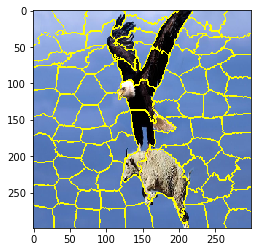


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6172861448209788
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16871855771899222
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08464219688318783
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08266619319654182
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.07350706048174795
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.05419806347141501
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.05153923308004444
The variance of the (posterior) coefficient 0.0
For feature of segmen

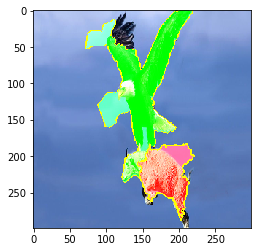

the number of features: 80


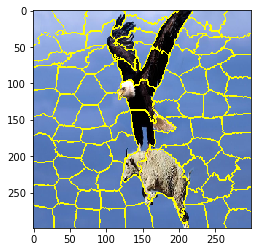


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6083803399770503
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.1580818888588942
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08887966547770078
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.08590092838310609
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08143748157954005
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06709835303051828
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.04526526737993215
The variance of the (posterior) coefficient 0.0
For feature of segment

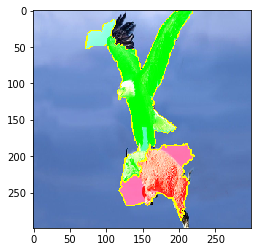

the number of features: 80


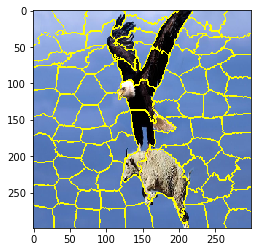


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6089493320427511
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.15681007407502576
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.10344672689150743
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09977664479844876
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.06965552900539146
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06341558543940722
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.04119083746501555
The variance of the (posterior) coefficient 0.0
For feature of segmen

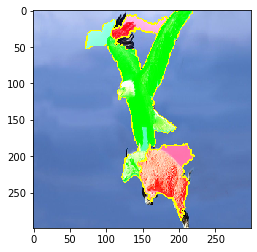

the number of features: 80


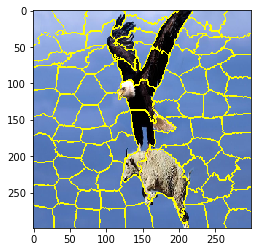


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6108302728038743
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16920167757775845
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.08974225268388766
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.07490672667526778
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07121412525006124
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.04609176187388571
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.03014080675903621
The variance of the (posterior) coefficient 0.0
For feature of segmen

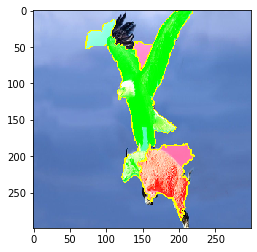

the number of features: 80


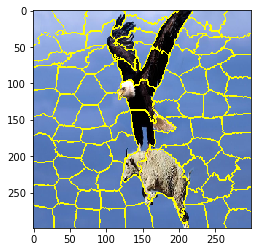


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6028605207605628
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17116707730413686
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.11029057231350181
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.09999996380625394
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09294044185831478
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.07663180484356022
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.032328818882810605
The variance of the (posterior) coefficient 0.0
For feature of segme

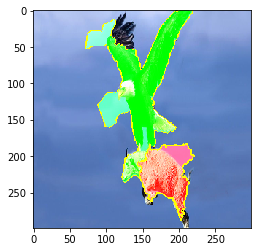

the number of features: 80


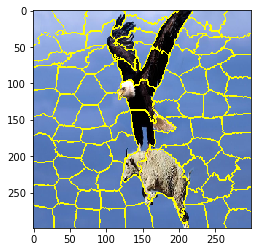


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.590890883825786
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.17605848473786923
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.09793772365480202
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09672052742103035
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07943732353031235
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.05170763643571182
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.03617883068134371
The variance of the (posterior) coefficient 0.0
For feature of segment 

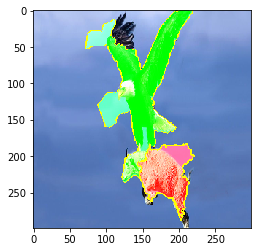

the number of features: 80


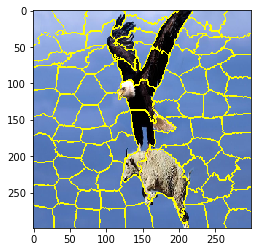


using non_Bay option for model regressor
For feature of segment 32
The mean of the (posterior) coefficient 0.6110748100187928
The variance of the (posterior) coefficient 0.0
For feature of segment 55
The mean of the (posterior) coefficient -0.16878403906263525
The variance of the (posterior) coefficient 0.0
For feature of segment 42
The mean of the (posterior) coefficient 0.09552481016382217
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.08165717760499541
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient 0.07443621718942947
The variance of the (posterior) coefficient 0.0
For feature of segment 9
The mean of the (posterior) coefficient 0.06552010177977177
The variance of the (posterior) coefficient 0.0
For feature of segment 56
The mean of the (posterior) coefficient -0.03719173158888969
The variance of the (posterior) coefficient 0.0
For feature of segmen

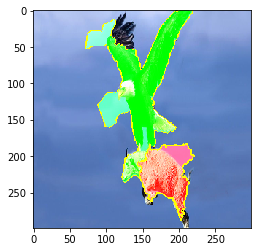

In [15]:
LIME_time_2=np.array([])
i=5
while i<=1500:
    
    n_samples=i


    temp=timeit.timeit(stmt='the_LIME_interpretor(n_samples)',
                    setup='from __main__ import the_LIME_interpretor, n_samples',
                    number=1)
    #print(temp[0], temp[1][0],temp[1][1])
    LIME_time_2=np.append(LIME_time_2,temp)
    i=i+55

No handles with labels found to put in legend.


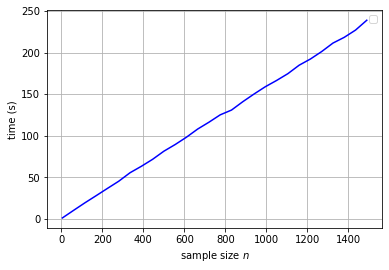

In [20]:
i=5
x_index=np.array([])
while i<=1500:
    x_index =np.append(x_index,i)
    i=i+55
## Above is to rescale the x axis; Note need to have the same setup with the loop above...

plt.plot(x_index,LIME_time_2,linestyle='-',color='blue')

#plt.plot(x_index[w:],IPSP_est_upper[w:],linestyle='dotted',color='purple',label='IPSP upper bound')

#plt.axis([1, len(MCMC_time), 0, np.max(MCMC_time)])# set the ranges of axis
plt.legend(fontsize=10)#bbox_to_anchor=(1,1)
plt.xlabel('sample size $n$')
plt.ylabel('time (s)')
plt.grid(True)

plt.show()

## Now let us see some examples of being inconsistant

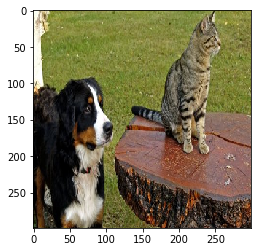

('n02107683', 'Bernese_mountain_dog', 0.6825596)
('n02107908', 'Appenzeller', 0.037938625)
('n02108000', 'EntleBucher', 0.015411606)
('n02107574', 'Greater_Swiss_Mountain_dog', 0.01443544)
('n02102040', 'English_springer', 0.0015393273)
the number of features: 46


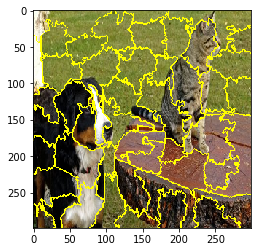


using non_Bay option for model regressor
For feature of segment 22
The mean of the (posterior) coefficient 0.3858526597214946
The variance of the (posterior) coefficient 0.0
For feature of segment 24
The mean of the (posterior) coefficient 0.20195754829208046
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient -0.13470287774159584
The variance of the (posterior) coefficient 0.0
For feature of segment 12
The mean of the (posterior) coefficient 0.12064857267213595
The variance of the (posterior) coefficient 0.0


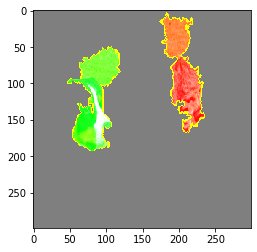

the number of features: 46


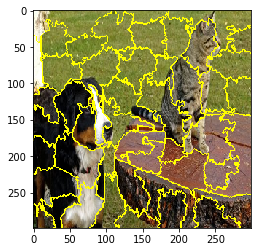


using non_Bay option for model regressor
For feature of segment 22
The mean of the (posterior) coefficient 0.3664328618159886
The variance of the (posterior) coefficient 0.0
For feature of segment 24
The mean of the (posterior) coefficient 0.17822086749365523
The variance of the (posterior) coefficient 0.0
For feature of segment 12
The mean of the (posterior) coefficient 0.15778683248228148
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient -0.12859216242152532
The variance of the (posterior) coefficient 0.0


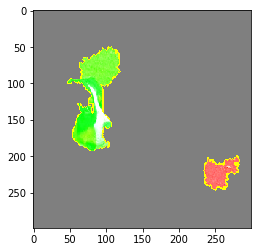

the number of features: 46


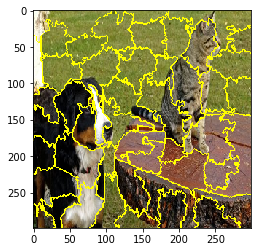


using non_Bay option for model regressor
For feature of segment 22
The mean of the (posterior) coefficient 0.37955676016108464
The variance of the (posterior) coefficient 0.0
For feature of segment 20
The mean of the (posterior) coefficient 0.16406702869150214
The variance of the (posterior) coefficient 0.0
For feature of segment 4
The mean of the (posterior) coefficient -0.14618466892645265
The variance of the (posterior) coefficient 0.0
For feature of segment 24
The mean of the (posterior) coefficient 0.1092353453560401
The variance of the (posterior) coefficient 0.0


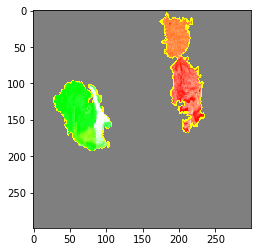

In [5]:
images = transform_img_fn([os.path.join('..\data','dogs.jpg')])
# I'm dividing by 2 and adding 0.5 because of
# how this Inception represents images
plt.imshow(images[0] / 2 + 0.5)
plt.show()
preds = inet_model.predict(images)
for x in decode_predictions(preds)[0]:
    print(x)
explainer = lime_image.LimeImageExplainer(feature_selection='none')#kernel_width=0.1   feature_selection='none'

i=1# do 3 times..
while i<=3:
# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
    explanation = explainer.explain_instance(images[0], inet_model.predict,
                                         top_labels=1, hide_color=0, batch_size=10,
                                         num_samples=100,model_regressor='non_Bay')#'non_Bay' 'Bay_non_info_prior' 'Bay_info_prior'

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=4, hide_rest=True)
    plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
    plt.show()
    i=i+1

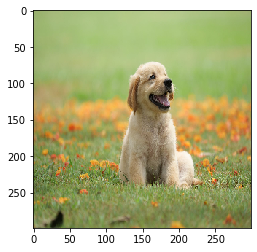

('n02099601', 'golden_retriever', 0.7591777)
('n02099712', 'Labrador_retriever', 0.13248245)
('n02102318', 'cocker_spaniel', 0.015283059)
('n02101556', 'clumber', 0.014689475)
('n02104029', 'kuvasz', 0.0038136626)
the number of features: 62


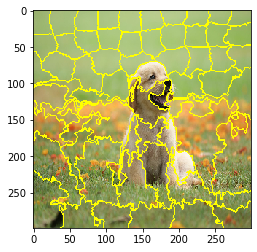


using non_Bay option for model regressor
For feature of segment 36
The mean of the (posterior) coefficient 0.15203581801275845
The variance of the (posterior) coefficient 0.0
For feature of segment 29
The mean of the (posterior) coefficient 0.1326002822151545
The variance of the (posterior) coefficient 0.0
For feature of segment 34
The mean of the (posterior) coefficient 0.11485766249987564
The variance of the (posterior) coefficient 0.0
For feature of segment 53
The mean of the (posterior) coefficient 0.07920289812587898
The variance of the (posterior) coefficient 0.0


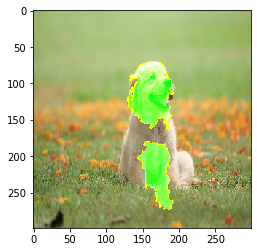

the number of features: 62


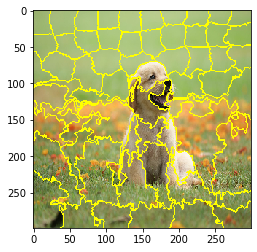


using non_Bay option for model regressor
For feature of segment 29
The mean of the (posterior) coefficient 0.14738705414431638
The variance of the (posterior) coefficient 0.0
For feature of segment 34
The mean of the (posterior) coefficient 0.12870928109929647
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.0955653856100046
The variance of the (posterior) coefficient 0.0
For feature of segment 46
The mean of the (posterior) coefficient 0.09333027275771939
The variance of the (posterior) coefficient 0.0


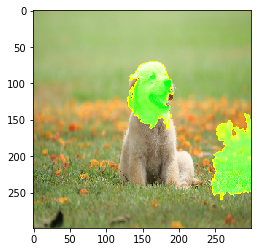

the number of features: 62


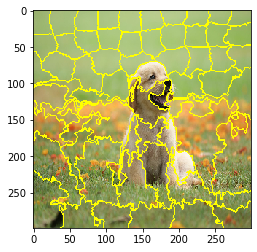


using non_Bay option for model regressor
For feature of segment 36
The mean of the (posterior) coefficient 0.13470410920857745
The variance of the (posterior) coefficient 0.0
For feature of segment 29
The mean of the (posterior) coefficient 0.10928848134902293
The variance of the (posterior) coefficient 0.0
For feature of segment 34
The mean of the (posterior) coefficient 0.09687670533258447
The variance of the (posterior) coefficient 0.0
For feature of segment 11
The mean of the (posterior) coefficient 0.07454184101802412
The variance of the (posterior) coefficient 0.0


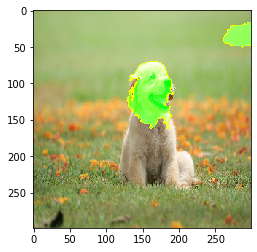

the number of features: 62


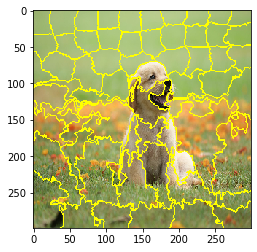


using non_Bay option for model regressor
For feature of segment 34
The mean of the (posterior) coefficient 0.111669183991059
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.08632335346319313
The variance of the (posterior) coefficient 0.0
For feature of segment 29
The mean of the (posterior) coefficient 0.08380933785097014
The variance of the (posterior) coefficient 0.0
For feature of segment 7
The mean of the (posterior) coefficient 0.0651951124347089
The variance of the (posterior) coefficient 0.0


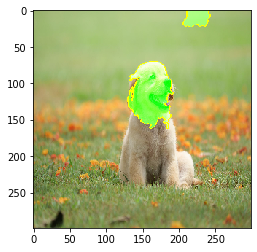

the number of features: 62


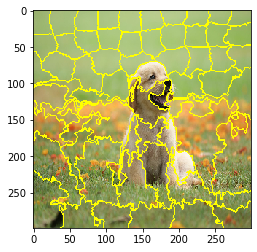


using non_Bay option for model regressor
For feature of segment 29
The mean of the (posterior) coefficient 0.10779253254921747
The variance of the (posterior) coefficient 0.0
For feature of segment 36
The mean of the (posterior) coefficient 0.09696396703439752
The variance of the (posterior) coefficient 0.0
For feature of segment 47
The mean of the (posterior) coefficient 0.0955682408799898
The variance of the (posterior) coefficient 0.0
For feature of segment 44
The mean of the (posterior) coefficient 0.08766305991965109
The variance of the (posterior) coefficient 0.0


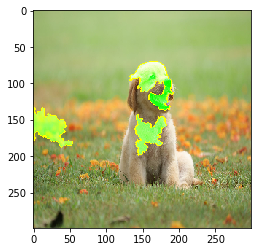

In [11]:
images = transform_img_fn([os.path.join('..\data','5.jpg')])
# I'm dividing by 2 and adding 0.5 because of
# how this Inception represents images
plt.imshow(images[0] / 2 + 0.5)
plt.show()
preds = inet_model.predict(images)
for x in decode_predictions(preds)[0]:
    print(x)
explainer = lime_image.LimeImageExplainer(feature_selection='none')#kernel_width=0.1   feature_selection='none'

i=1# do 3 times..
while i<=5:
# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
    explanation = explainer.explain_instance(images[0], inet_model.predict,
                                         top_labels=1, hide_color=0, batch_size=10,
                                         num_samples=100,model_regressor='non_Bay')#'non_Bay' 'Bay_non_info_prior' 'Bay_info_prior'

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=4, hide_rest=False)
    plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
    plt.show()
    i=i+1